# Capstone Project

---

# Overview: Project Anthropocene

Project Anthropocene is a model that enables the insightful analysis of the impact of carbon dioxide (CO2) on the Earth's temperature.

## Learning Outcome

* Follow an end-to-end modelling and simulation workflow using the Engineering Design Process introduced in section 4.
* Learn how to interpret relationships, develop insights, and validate a system model in any given context or problem space.

## Table of Contents

* [System Requirements](#System-Requirements)
  * [Analysis Requirements](#Analysis-Requirements)
  * [Visual System Mapping: Causal Loop Diagram (CLD)](#Visual-System-Mapping:-Causal-Loop-Diagram-(CLD))
  * [Visual System Mapping: Stock & Flow Diagram](#Visual-System-Mapping:-Stock-&-Flow-Diagram)
  * [Mathematical Specification](#Mathematical-Specification)
* [System Design](#System-Design)
  * [Differential Specification](#Differential-Specification)
  * [cadCAD Model](#cadCAD-Model)
    0. [Dependencies](#0.-Dependencies)
    1. [State Variables](#1.-State-Variables)
    2. [System Parameters](#2.-System-Parameters)
    3. [Policy Functions](#3.-Policy-Functions)
    4. [State Update Functions](#4.-State-Update-Functions)
    5. [Partial State Update Blocks](#5.-Partial-State-Update-Blocks)
    6. [Configuration](#6.-Configuration)
    7. [Execution](#7.-Execution)
    8. [Simulation Output Preparation](#8.-Simulation-Output-Preparation)
* [System Validation](#System-Validation)
  * [What-if Matrix](#What-if-Matrix)
  * [System Analysis](#System-Analysis)

# System Requirements

<center><img src="images/edp-phase-1.png" alt="Engineering Design Process, phase 1 - System requirements" width="60%"/>

## Requirements Analysis

**Planned analysis:** How does the Earth's temperature evolve over the next 100 years under various assumptions regarding CO2 emissions?

* What will the Earth's temperature be if the annual CO2 emissions remain constant?
    * And if they are doubled?
* What will be the Earth's temperature be if we stop emitting CO2 now?
    * And 10 years from now? or 50 years?

## Visual System Mapping: Stock & Flow Diagram

<center>
<img src="images/stock_flow.png" alt="Stock & Flow diagram for Project Anthropocene" width="70%"/>

## Mathematical Specification


The Anthropocene system is an IVP (initial value problem) which is described by the following equations:

\begin{align}
\tag{1}
dCO_2(t) = \begin{cases}
    \mathcal{N}(\mu,  \sigma) & \forall t \in [0, t_w] \\
     \mathcal{N}(0,  \sigma) & \forall t \in [t_w, \infty]
            \end{cases}
\end{align}

\begin{align}
\tag{2}
\alpha(t) = 1 - e^{-\beta * CO_2(t)}
\end{align}

\begin{align}
\tag{3}
Y(t) = \alpha(t) Z(t)
\end{align}

\begin{align}
\tag{4}
Z(t) = K T(t)^4
\end{align}

\begin{align}
\tag{5}
dT(t) = \gamma(a + Y(t) - Z(t))
\end{align}


Where $\mathcal{N}$ represents the normal distribution with mean $\mu$ and standard deviation $\sigma$. For each timestep $t$ we have the $CO_2(t)$, $\alpha(t)$, $Y(t)$, $T(t)$ and $Z(t)$ being the atmospheric $CO_2$ concentration, the atmosphere reflectance, the reflected radiation, the surface temperature and the outgoing radiation respectively. Also, we have the $\beta$, $\gamma$, $a$, $K$, $t_w$ constants as being a $CO_2$ to reflectance conversion factor, a radiation to temperature conversion factor, the Sun's yearly radiance, a constant for the blackbody effect and the year where emissions are stopped.

The system is tightly coupled and is both non-linear and stochastic, which can make mathematical treatment difficult, and as such, the characterization of it will be made easier through an experimental approach and computational simulations, which is exactly what **cadCAD** enables us to do.

# System Design

<center><img src="images/edp-phase-2.png" alt="Engineering Design Process, phase 1 - System design" width="60%"/>

## Differential Specification

<center><img src="images/s7-differential-spec-anthropocene.png" alt="Model for Project Anthropocene" width="70%"/>

## cadCAD Model

### 0. Dependencies

In [1]:
import pandas as pd
import numpy as np
from random import normalvariate
import plotly.express as px

from cadCAD.configuration.utils import config_sim
from cadCAD.configuration import Experiment
from cadCAD.engine import ExecutionMode, ExecutionContext, Executor

### 1. State Variables

The states we are interested in, their state variables and their initial values are:

* The __atmosphere's CO2 concentration__ in parts per million (ppm): `co2`, initial value 400
* The __earth's surface temperature__ in Kelvin (K): `temperature`, initial value 290
    
<!--**Create a dictionary and define the above state variables and their initial values:**-->

In [2]:
initial_state = {
    'co2': 400,
    'temperature': 290
}

### 2. System Parameters

**The system parameters we need to define are:**

* The sun radiation: `sun_radiation` with value `1361`
* A constant representing the relationship between temperature and radiation: `temperature_constant` with value `5e-4`
* A constant representing CO2 impact on the radiation balance via the greenhouse effect: `co2_reflectance_factor` with value `1e-3`
* A unit conversion constant that relates how much gigatons of CO2 we need to have an additional part per million unit in the atmosphere's concentration: `co2_gigatons_to_ppm` with value `1.2e-1`
* The standard deviation for the stochastic process generating the yearly CO2 concentration: `co2_stdev` with value `40` ppm
* A constant representing how much heat dissipitates into space: `heat_dissipation_constant` with value `2075`

**There are two parameters which we want to sweep, which are:**

* A parameter which represents the annual CO2 emissions in units of billion tons, which is the `co2_trend`. Let's sweep three values for it: `0`, `40` and `80`. The first value simulates a scenario where we stop all emissions at once, while using `40` means no additional emissions beyond what we already emmit every year, and `80` means that we are going to double our emissions.
* The `year_of_the_wakening`, which is the number of years that must pass before we set the `co2_trend` to zero. Let's sweep four values for it: `0`, `10`, `50` and `100`.

<!--**Create a dictionary and define the above parameters and their initial values:**-->

In [6]:
system_params = {
    'sun_radiation': [1361],
    'temperature_constant': [5e-4],
    'co2_reflectance_factor': [1e-3], 
    'co2_gigatons_to_ppm': [1.2e-1],
    'co2_stdev': [40],
    'heat_dissipation_constant': [2075], 
    'co2_trend': [40, 80, 40, 80, 40, 80, 40, 80],
    'year_of_the_wakening': [0, 0, 10, 10, 50, 50, 100, 100]
}

### 3. Policy Functions

In [7]:
def p_co2_emissions(params, 
                    subbstep, 
                    state_history, 
                    previous_state):
    # Parameters & variables
    mean = params['co2_trend']
    std = params['co2_stdev']
    conversion_factor = params['co2_gigatons_to_ppm']
    t_w = params['year_of_the_wakening']
    t = previous_state['timestep']
    
    # Logic
    if t > t_w:
        mean = 0
    else:
        mean = mean
    value = normalvariate(mean, std) * conversion_factor

    # Output
    return {'add_co2': value}

In [8]:
def p_sun_radiation(params, 
                    substep, 
                    state_history, 
                    previous_state):
    # Parameters & variables
    g = params['temperature_constant']
    a = params['sun_radiation']
    
    # Logic
    temp_change = g * a
    
    # Output
    return {'add_temperature': temp_change}

In [9]:
def p_earth_cooling(params, 
                    substep, 
                    state_history, 
                    previous_state):
    # Parameters & variables
    g = params['temperature_constant']
    K = params['heat_dissipation_constant']
    T = previous_state['temperature']
    
    # Logic
    temp_change = -(g * K * (T / 300) ** 4)
    
    # Output
    return {'add_temperature': temp_change}

In [10]:
def p_greenhouse_effect(params, 
                        substep, 
                        state_history, 
                        previous_state):
    # Parameters & variables
    g = params['temperature_constant']
    K = params['heat_dissipation_constant']
    beta = params['co2_reflectance_factor']
    T = previous_state['temperature']
    CO2 = previous_state['co2']
    
    # Logic
    alpha = (1 - np.exp(-beta * CO2))
    temp_change = g * alpha * K * (T / 300) ** 4
    
    # Output
    return {'add_temperature': temp_change}

### 4. State Update Functions

In [11]:
def s_co2(params, 
          substep, 
          state_history, 
          previous_state,
          policy_input):
    # Parameters & variables
    current_co2 = previous_state['co2']
    co2_change = policy_input['add_co2']
    
    # Logic
    new_co2 = max(current_co2 + co2_change, 0)
    
    # Output
    return ('co2', new_co2)

In [12]:
def s_temperature(params, 
                  substep, 
                  state_history, 
                  previous_state,
                  policy_input):
    # Parameters & variables
    current_temp = previous_state['temperature']
    temp_change = policy_input['add_temperature']
    
    # Logic
    new_temp = max(current_temp + temp_change, 0)
    
    # Output
    return ('temperature', new_temp)

### 5. Partial State Update Blocks

In [13]:
partial_state_update_blocks = [
    {
        'label': 'Temperature dynamics', # Useful metadata to describe our partial state update blocks
        'policies': {
            'sun_radiation': p_sun_radiation,
            'earth_cooling': p_earth_cooling,
            'greenhouse_effect': p_greenhouse_effect
        },
        'variables': {
            'temperature': s_temperature
            
        }
    },
    {
        'label': 'CO2 dynamics', # Useful metadata to describe our partial state update blocks
        'policies': {
            'co2_emissions': p_co2_emissions
        },
        'variables': {
            'co2': s_co2
        }
        
    }
]


### 6. Configuration

In [14]:
MONTE_CARLO_RUNS = 50
SIMULATION_TIMESTEPS = 100

sim_config = config_sim(
    {
        'N': MONTE_CARLO_RUNS,
        'T': range(SIMULATION_TIMESTEPS),
        'M': system_params,
    }
)

from cadCAD import configs
del configs[:] # Clear any prior configs

exp = Experiment()
exp.append_configs(
    sim_configs=sim_config,
    initial_state=initial_state,
    partial_state_update_blocks=partial_state_update_blocks
)

### 7. Execution

In [15]:
exec_mode = ExecutionMode()
exec_context = ExecutionContext(exec_mode.local_mode)
run = Executor(exec_context=exec_context, configs=configs)

(system_events, tensor_field, sessions) = run.execute()


                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 8
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 8, 50, 2)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4

### 8. Simulation Output Preparation

In [16]:
# Get system events and attribute index
df = (pd.DataFrame(system_events)
        .assign(years=lambda df: df.timestep)
        .assign(temperature_celsius=lambda df: df.temperature - 273)
        .query('timestep > 0')
     )

# Clean substeps
first_ind = (df.substep == 0) & (df.timestep == 0)
last_ind = df.substep == max(df.substep)
inds_to_drop = (first_ind | last_ind)
df = df.loc[inds_to_drop].drop(columns=['substep'])

# Attribute parameters to each row
df = df.assign(**configs[0].sim_config['M'])
for i, (_, n_df) in enumerate(df.groupby(['simulation', 'subset', 'run'])):
    df.loc[n_df.index] = n_df.assign(**configs[i].sim_config['M'])

# System Validation

<center><img src="images/edp-phase-3.png" alt="Engineering Design Process, phase 1 - validation" width="60%"/>

## What-if Matrix

What-if-question | Type of experiment | Variables / parameters | Values / Ranges to be tested
- | - | - | -
What is Earth temperature over the years if we don't reduce CO2 emissions? | Parameter Sweep + Monte Carlo runs | co2_trend | 40 and 80 Gigatons
What is the annual temperature increase if we don't reduce CO2 emissions? | Parameter Sweep + Monte Carlo runs | co2_trend | 40 and 80 Gigatons
What is the annual temperature increase if we wake up after some years? | Parameter Sweep + Monte Carlo runs | year_of_the_wakening | 0, 10, 50 and 100 years
What is Earth temperature over the years if we wake up after some years? | Parameter Sweep + Monte Carlo runs | year_of_the_wakening | 0, 10, 50 and 100 years

## System Analysis

### Analysis 1: Earth temperature over the years if we don't reduce CO2 emissions

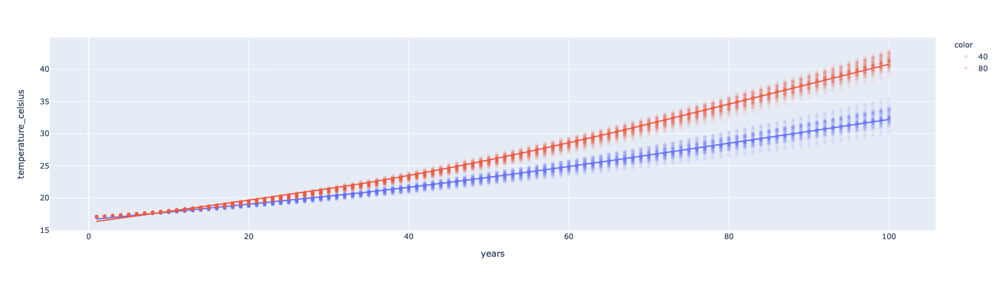

In [17]:
fig_df = df.query('year_of_the_wakening == 100')

fig = px.scatter(
    fig_df,
    x=fig_df.years,
    y=fig_df.temperature_celsius,
    color=fig_df.co2_trend.astype(str),
    opacity=0.1,
    trendline="lowess"
)

fig.show()

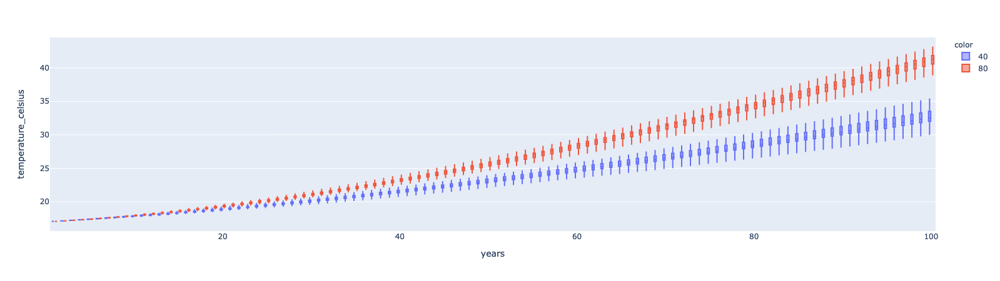

In [18]:
fig_df = df.query('year_of_the_wakening == 100')

fig = px.box(
    fig_df,
    x=fig_df.years,
    y=fig_df.temperature_celsius,
    color=fig_df.co2_trend.astype(str),
    points=False
)

fig.show()

### Analysis 2: Annual temperature increase if we don't reduce CO2 emissions

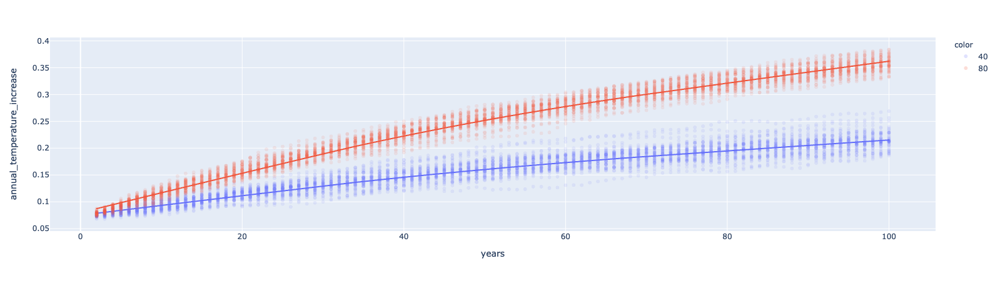

In [19]:
fig_df = (df.query('year_of_the_wakening == 100')
            .assign(annual_temperature_increase=lambda df: df.temperature.diff())
            .query('years > 1'))

fig = px.scatter(
    fig_df,
    x=fig_df.years,
    y=fig_df.annual_temperature_increase,
    opacity=0.1,
    trendline="lowess",
    color=fig_df.co2_trend.astype(str)
)

fig.show()

### Analysis 3: Compare annual temperature increase for different wakening years

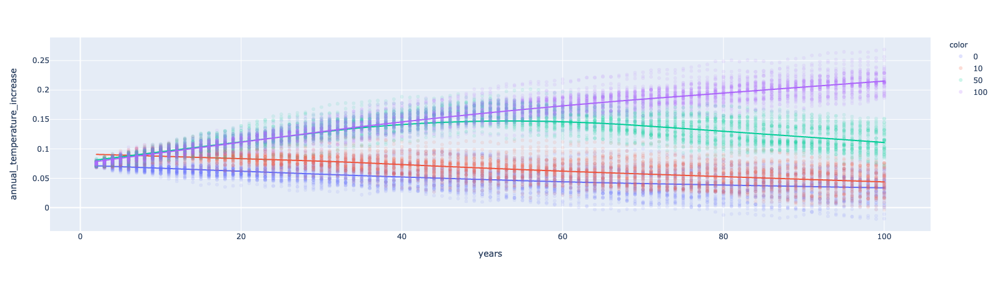

In [20]:
fig_df = (df.query('co2_trend == 40')
            .assign(annual_temperature_increase=lambda df: df.temperature.diff())
            .query('years > 1'))

fig = px.scatter(
    fig_df,
    x=fig_df.years,
    y=fig_df.annual_temperature_increase,
    opacity=0.1,
    trendline="lowess",
    color=fig_df.year_of_the_wakening.astype(str)
)

fig.show()

### Analysis 4: We must do something within the next 10-15 years to avoid a 2 degree increase in temperature

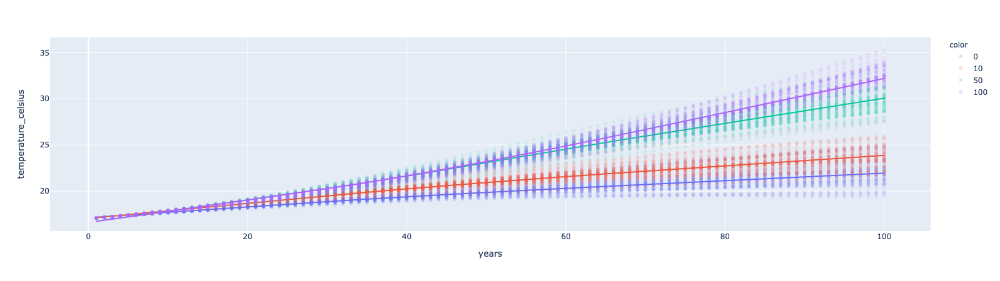

In [21]:
fig_df = df.query('co2_trend == 40')

fig = px.scatter(
    fig_df,
    x=fig_df.years,
    y=fig_df.temperature_celsius,
    opacity=0.1,
    trendline="lowess",
    color=fig_df.year_of_the_wakening.astype(str)
)

fig.show()

Screenshot of the original model by Danilo Lessa Bernadineli

![](./images/model-earth.jpg)
